In [2]:
import numpy as np
import torch

In [3]:
from pathlib import Path

In [4]:
import os

In [5]:
from sklearn.linear_model import Ridge, LinearRegression, Lasso
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import NearestNeighbors

In [6]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

# https://plotly.com/python/creating-and-updating-figures/
import plotly.graph_objects as go

from mpl_toolkits import mplot3d

In [7]:
# from orbit_datasets import neworbits, versatileorbits, staticorbits
from ldcl.data import neworbits, versatileorbits, staticorbits

In [8]:
orbits_dataset = neworbits.OrbitsDataset()
orbits_loader = torch.utils.data.DataLoader(
    dataset = orbits_dataset,
    shuffle = True,
    batch_size = 1,
)

Current dE:  [1.59872116e-14]
eccentricity:  [0.99214041]
Current dE:  [1.15463195e-14]
eccentricity:  [0.92853018]
It took 6.465750694274902 time to finish the job.


In [9]:
def getRepresentations(encoder_location):
    branch_encoder = torch.load(encoder_location, map_location=torch.device('cpu'))
    branch_encoder.eval()
    
    encoder_outputs_list = []
    target_values = []

    for it, (input1, input2, y) in enumerate(orbits_loader):
        predicted_representation = branch_encoder(input1.float()).detach().numpy()[0]
        encoder_outputs_list.append(predicted_representation)

        #append conserved quantities to the end of the representation for plotting, y = (1, )
        #[2=phi0,3=energy,4=angular_momentum] discard [0=eccentricity, 1=semimajor_axis]
        target_values.append(np.array([y[0][2],y[0][3],y[0][4]]))
        
    encoder_outputs = np.vstack(encoder_outputs_list)
    target_values = np.vstack(target_values)

    phi0_c_values = target_values[:,0]
    energy_c_values = target_values[:,1]
    angular_momentum_c_values = target_values[:,2]
    
    return encoder_outputs, [phi0_c_values, energy_c_values, angular_momentum_c_values]

In [10]:
def applyModel(model_location, encoder_outputs):
    branch_apply = torch.load(model_location, map_location=torch.device('cpu'))
    branch_apply.eval()
    
    projected = branch_apply(torch.tensor(encoder_outputs).float()).detach().numpy()
    
    return projected

# Important:
## Run cells from the start of each heading to plot properly

### infoNCE Loss, Projection Head with 1 hidden layer, 3 dimensional embedding

In [33]:
ENCODER_PATH = Path("saved_models/simclr_infoNCE_1hidden_3dim/final_encoder.pt")
print(ENCODER_PATH)
encoder_outputs, conserved_quantities = getRepresentations(ENCODER_PATH)
annotations = [f'phi_0: {p:.3f}, H: {h:.3f}, L: {l:.3f}' for (p,h,l) in zip(*conserved_quantities)]

saved_models\simclr_infoNCE_1hidden_3dim\final_encoder.pt


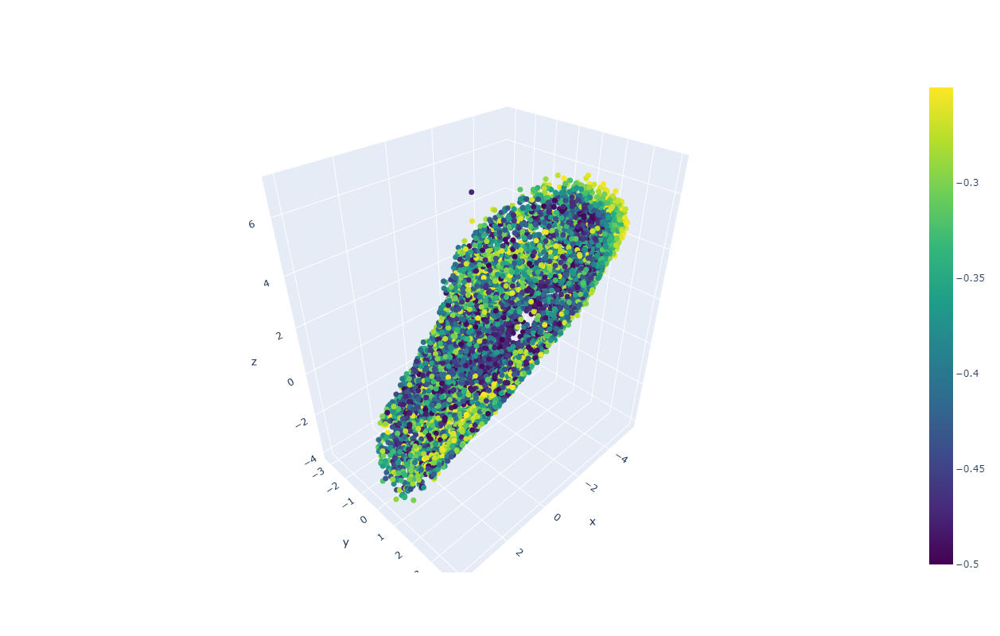

In [28]:
fig = go.Figure(data = [go.Scatter3d(
        x=encoder_outputs[:, 0],
        y=encoder_outputs[:, 1],
        z=encoder_outputs[:, 2],
        mode='markers',
        text = annotations,
        marker=dict(
            size=4,
            color=conserved_quantities[1], # 0 for angle, 1 for energy, 2 for angular momentum
            colorscale='viridis',
            opacity=1,
            showscale = True
        )
    )],
    layout=go.Layout(height=800, width=1000)
    )
fig.show()

### Notes
Weird shape, does encode phi<sub>0</sub> and angular momentum, but energy is still wonky\
shape is hollow, very bizarre

### infoNCE Loss, Projection Head with 2 hidden layers, 3 dimensional embedding

In [21]:
ENCODER_PATH = Path("saved_models/simclr_infoNCE_2hidden_3dim/final_encoder.pt")
print(ENCODER_PATH)
encoder_outputs, conserved_quantities = getRepresentations(ENCODER_PATH)
annotations = [f'phi_0: {p:.3f}, H: {h:.3f}, L: {l:.3f}' for (p,h,l) in zip(*conserved_quantities)]

saved_models\simclr_infoNCE_2hidden_3dim\final_encoder.pt


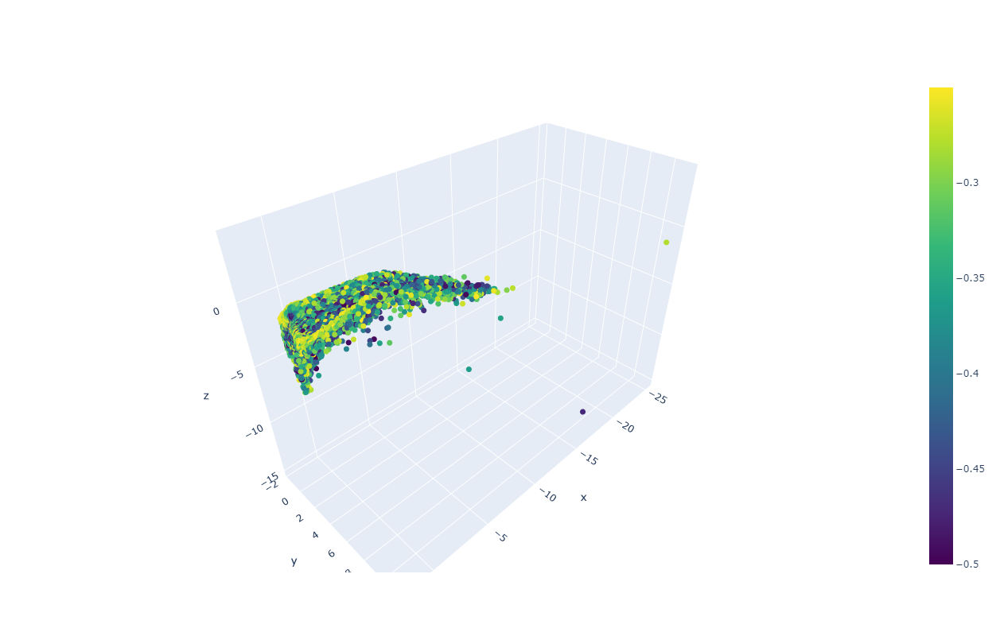

In [25]:
fig = go.Figure(
        data=[go.Scatter3d(
        x=encoder_outputs[:, 0],
        y=encoder_outputs[:, 1],
        z=encoder_outputs[:, 2],
        mode='markers',
        text = annotations,
        marker=dict(
            size=4,
            color=conserved_quantities[1], # 0 for angle, 1 for energy, 2 for angular momentum
            colorscale='viridis',
            opacity=1,
            showscale = True
        )
    )],
    layout=go.Layout(height=800, width=1000)
)
fig.show()

In [44]:
PROJ_PATH = Path("saved_models/simclr_infoNCE_2hidden_3dim/final_projector.pt")
projected_outputs = applyProjection(PROJ_PATH, encoder_outputs)

In [23]:
fig = go.Figure(
        data=[go.Scatter3d(
        x=projected_outputs[:, 0],
        y=projected_outputs[:, 1],
        z=projected_outputs[:, 2],
        mode='markers',
        marker=dict(
            size=4,
            color=conserved_quantities[1], # 0 for angle, 1 for energy, 2 for angular momentum
            colorscale='viridis',
            opacity=1,
            showscale = True
        )
    )],
    layout=go.Layout(height=800, width=1000)
)
fig.show()

NameError: name 'projected_outputs' is not defined

### Notes
Successfully embeds angle (radially around the shape) and angular momentum (distance from center)\
Embedding for energy looks very weird, somewhat looks like lower energies are in the "center" of the shape, but hard to tell, further experiments required\
appears to look like some kind of two dimensional surface

### InfoNCE, Projection head with one hidden layer, 3 dimensional embedding, projected to 4 dimensions

In [16]:
from sklearn.decomposition import PCA

In [30]:
ENCODER_PATH = Path("saved_models/simclr_infoNCE_1hidden_3dim_4dim_proj/final_encoder.pt")
print(ENCODER_PATH)
encoder_outputs, conserved_quantities = getRepresentations(ENCODER_PATH)

saved_models\simclr_infoNCE_1hidden_3dim_4dim_proj\final_encoder.pt


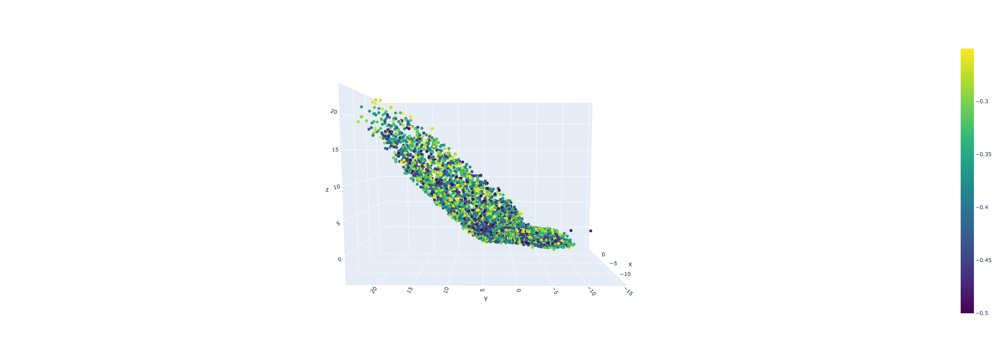

In [32]:
fig = go.Figure(
        data=[go.Scatter3d(
        x=encoder_outputs[:, 0],
        y=encoder_outputs[:, 1],
        z=encoder_outputs[:, 2],
        mode='markers',
        marker=dict(
            size=4,
            color=conserved_quantities[1], # 0 for angle, 1 for energy, 2 for angular momentum
            colorscale='viridis',
            opacity=1,
            showscale = True
        )
    )],
    layout=go.Layout(height=800, width=1000)
)
fig.show()

### SimSiam

In [12]:
ENCODER_PATH = Path("saved_models/simsiam_test/final_encoder.pt")
print(ENCODER_PATH)
encoder_outputs, conserved_quantities = getRepresentations(ENCODER_PATH)
annotations = [f'phi_0: {p:.3f}, H: {h:.3f}, L: {l:.3f}' for (p,h,l) in zip(*conserved_quantities)]

saved_models\simsiam_test\final_encoder.pt


In [13]:
PROJ_PATH = Path("saved_models/simsiam_test/final_projector.pt")
PRED_PATH = Path("saved_models/simsiam_test/final_predictor.pt")
proj_outputs = applyModel(PROJ_PATH, encoder_outputs)
pred_outputs = applyModel(PRED_PATH, proj_outputs)

pred_outputs = np.concatenate((pred_outputs, np.zeros((1,3))))
#all_outputs = np.concatenate((proj_outputs, pred_outputs))

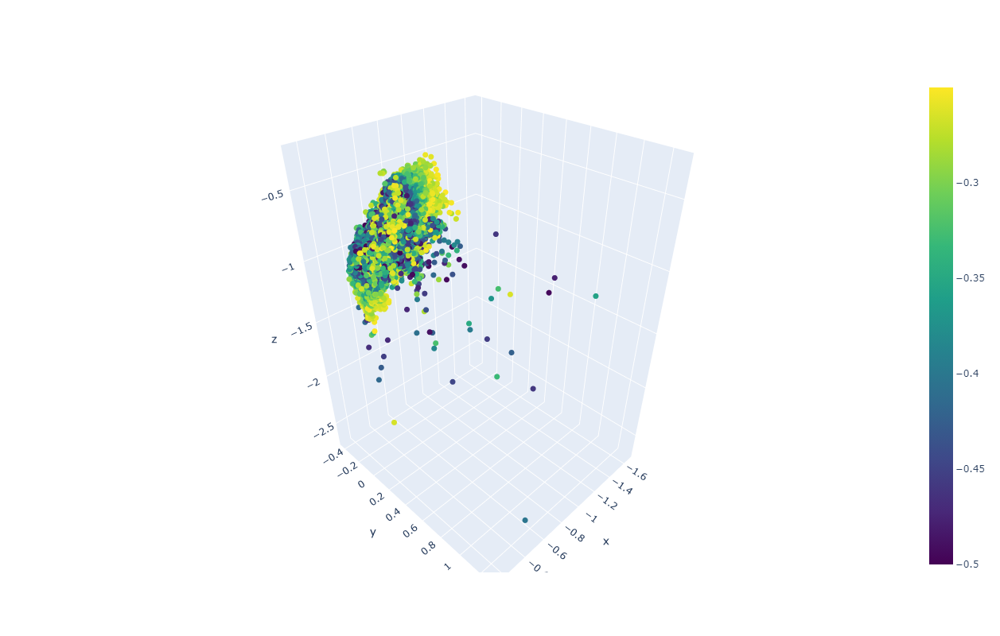

In [16]:
fig = go.Figure(
        data=[go.Scatter3d(
        x=encoder_outputs[:, 0],
        y=encoder_outputs[:, 1],
        z=encoder_outputs[:, 2],
        mode='markers',
        text = annotations,
        marker=dict(
            size=4,
            color=conserved_quantities[1], # 0 for angle, 1 for energy, 2 for angular momentum
            colorscale='viridis',
            opacity=1,
            showscale = True
        )
    )],
    layout=go.Layout(height=800, width=1000)
)
fig.show()

In [20]:
from sklearn.linear_model import LinearRegression

In [21]:
l = LinearRegression()
l.fit(pred_outputs[:, :2], pred_outputs[:, 2])

LinearRegression()

In [23]:
print(l.intercept_)

-0.52635133


In [24]:
print(l.coef_)

[-4.6684475 -4.9075947]


In [25]:
l.score(pred_outputs[:, :2], pred_outputs[:, 2])

0.9928728900909449